

# 🎥✨ Mastering Movie Genre Classification with Machine Learning 🚀🍿


**Objective of the Project** 🎥
- Aim: to build a machine learning model that predicts the genre of a movie based on its plot summary.
- Techniques:  TF-IDF for text representation and classifiers such as Logistic Regression,
 Naive Bayes, and SVM for prediction.


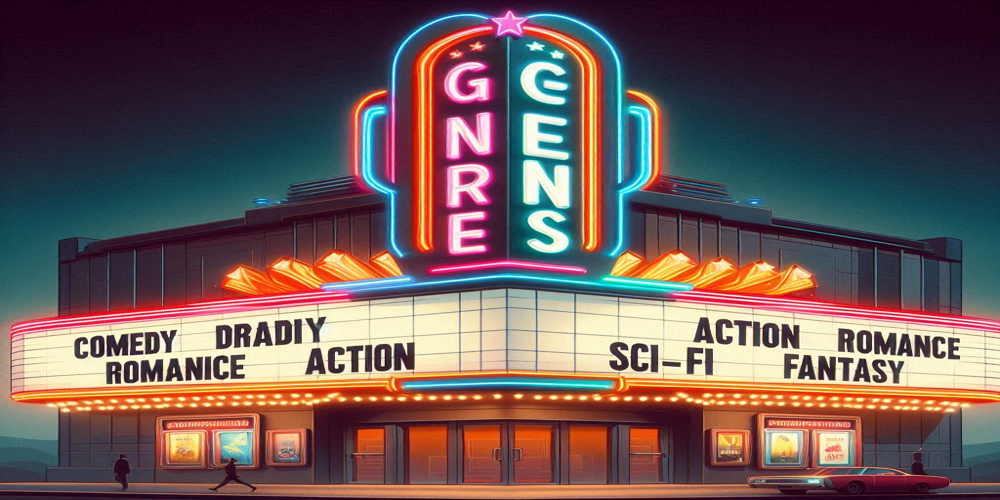

In [115]:
from PIL import Image
from IPython.display import display
display(Image.open('img.png').resize((1000, 500)) or Image.open('img.png'))

In [116]:
import pandas as pd

In [117]:
import warnings
with warnings.catch_warnings():
     warnings.simplefilter("ignore")

<b> Data Loading 📥</b>

In [118]:
column1 = [ 'Movie Name' , 'Genre' , 'Description']
train_data = pd.read_csv('train_data.txt' , delimiter=':::',engine='python', names=column1 , index_col=0 )
print("Training Data:")
train_data.head(2)

Training Data:


,Movie Name,Genre,Description
1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
2,Cupid (1997),thriller,A brother and sister with a past incestuous r...


In [119]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54214 entries, 1 to 54214
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Movie Name   54214 non-null  object
 1   Genre        54214 non-null  object
 2   Description  54214 non-null  object
dtypes: object(3)
memory usage: 1.7+ MB


In [120]:
print("Training set null values:","\n",train_data.isnull().sum())

Training set null values: 
 Movie Name     0
Genre          0
Description    0
dtype: int64


In [121]:
print("Training Duplicates:", train_data.duplicated().sum())

Training Duplicates: 0


In [122]:
column2 = ['Movie Name' , 'Description']
test_data = pd.read_csv('test_data.txt', delimiter=':::' , engine='python' , names=column2 , index_col=0 )

print("\nTesting Data:")
test_data.head(2)


Testing Data:


,Movie Name,Description
1,Edgar's Lunch (1998),"L.R. Brane loves his life - his car, his apar..."
2,La guerra de papá (1977),"Spain, March 1964: Quico is a very naughty ch..."


In [123]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54200 entries, 1 to 54200
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Movie Name   54200 non-null  object
 1   Description  54200 non-null  object
dtypes: object(2)
memory usage: 1.2+ MB


In [124]:
print("Test set null values:","\n",test_data.isnull().sum())

Test set null values: 
 Movie Name     0
Description    0
dtype: int64


In [125]:
print("Test Duplicates:", test_data.duplicated().sum())

Test Duplicates: 0


In [126]:
column3 = [ 'Movie Name' , 'Genre' , 'Description']
test_data_solution = pd.read_csv('test_data_solution.txt', delimiter=':::' , engine='python' , names=column3 , index_col=0 )
print("\nTest Data Solution:")
test_data_solution.head(2)


Test Data Solution:


,Movie Name,Genre,Description
1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar..."
2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch..."


<!-- train_path = "/kaggle/input/genre-classification-dataset-imdb/Genre Classification Dataset/train_data.txt"
train_data = pd.read_csv(train_path, sep=':::', names=['Title', 'Genre', 'Description'], engine='python')
train_data -->

In [127]:
test_data_solution.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54200 entries, 1 to 54200
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Movie Name   54200 non-null  object
 1   Genre        54200 non-null  object
 2   Description  54200 non-null  object
dtypes: object(3)
memory usage: 1.7+ MB


In [128]:
print("Test Data Solution set null values:","\n",test_data_solution.isnull().sum())

Test Data Solution set null values: 
 Movie Name     0
Genre          0
Description    0
dtype: int64


In [129]:
print("Test_Solution Duplicates:", test_data_solution.duplicated().sum())

Test_Solution Duplicates: 0


In [130]:
unique_genres_train = train_data['Genre'].unique()

In [131]:
print("Unique genres:")
count = 0 
for genre in unique_genres_train:
    print(genre)
    count+=1
print("Total Geners:",count)

Unique genres:
 drama 
 thriller 
 adult 
 documentary 
 comedy 
 crime 
 reality-tv 
 horror 
 sport 
 animation 
 action 
 fantasy 
 short 
 sci-fi 
 music 
 adventure 
 talk-show 
 western 
 family 
 mystery 
 history 
 news 
 biography 
 romance 
 game-show 
 musical 
 war 
Total Geners: 27


Dropping the movie name:

In [132]:
train_data= train_data.drop(columns=['Movie Name'])
train_data.head(2)

,Genre,Description
1,drama,Listening in to a conversation between his do...
2,thriller,A brother and sister with a past incestuous r...


 Count the occurrences of each genre

In [133]:
train_data['Genre'].value_counts()

Genre
drama           13613
documentary     13096
comedy           7447
short            5073
horror           2204
thriller         1591
action           1315
western          1032
reality-tv        884
family            784
adventure         775
music             731
romance           672
sci-fi            647
adult             590
crime             505
animation         498
sport             432
talk-show         391
fantasy           323
mystery           319
musical           277
biography         265
history           243
game-show         194
news              181
war               132
Name: count, dtype: int64

In [134]:
import plotly.express as px

In [135]:
genre_counts = train_data['Genre'].value_counts().reset_index()
genre_counts.columns = ['Genre', 'Count']

In [136]:
fig = px.bar(
    genre_counts,
    x='Genre',
    y='Count',
    title='Distribution of Movie Genres',
    labels={'Genre': 'Genre', 'Count': 'Number of Movies'},
    color='Count',
    color_continuous_scale='Viridis'
)
fig.show()

In [137]:
fig = px.pie(
    genre_counts,
    names='Genre',
    values='Count',
    title='Distribution of Movie Genres',
    color_discrete_sequence=px.colors.sequential.Viridis
)
fig.update_layout(
    width=800,
    height=600,
    title={
        'text': "Distribution of Movie Genres",
    
    },

)
fig.show()

The Natural Language Toolkit (NLTK) is a comprehensive library for natural language processing (NLP).

In [138]:
import nltk

In [139]:
train_data['Num_Characters'] = train_data['Description'].apply(len)
train_data.head(2)

,Genre,Description,Num_Characters
1,drama,Listening in to a conversation between his do...,546
2,thriller,A brother and sister with a past incestuous r...,184


🧹 Data Preprocessing

Clean and preprocess the text data to remove noise and irrelevant information.



In [140]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import string
from sklearn.preprocessing import LabelEncoder
import re

In [141]:
descriptions = train_data['Description'].tolist()

In [142]:
stemmer = PorterStemmer()
stop_words = set(stopwords.words('english'))

In [143]:
def preprocess_description(description):
    description = description.lower()                           # Convert to lowercase
    tokens = word_tokenize(description)                          # Tokenize the description
    tokens = [re.sub(r'[^a-z]', '', token) for token in tokens]  # Remove non-alphabetic characters
    tokens = [token for token in tokens if token not in stop_words and token != '']  # Remove stop words and empty strings
    stemmed_tokens = [stemmer.stem(token) for token in tokens]  # Stem the tokens
    return ' '.join(stemmed_tokens)                              # Join tokens back into a string


In [144]:
train_data['Transformed_Description'] = [preprocess_description(description) for description in descriptions]
test_data['Transformed_Description'] = test_data['Description'].apply(preprocess_description)
test_data_solution['Transformed_Description'] = test_data_solution['Description'].apply(preprocess_description)

In [145]:
label_encoder = LabelEncoder()
train_data['Genre_Encoded'] = label_encoder.fit_transform(train_data['Genre'])
test_data_solution['Genre_Encoded'] = label_encoder.transform(test_data_solution['Genre'])


In [146]:
train_data.head(2)

,Genre,Description,Num_Characters,Transformed_Description,Genre_Encoded
1,drama,Listening in to a conversation between his do...,546,listen convers doctor parent yearold oscar lea...,8
2,thriller,A brother and sister with a past incestuous r...,184,brother sister past incestu relationship curre...,24


In [147]:
test_data_solution.head(2)

,Movie Name,Genre,Description,Transformed_Description,Genre_Encoded
1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar...",lr brane love life car apart job especi girlfr...,24
2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch...",spain march quico naughti child three belong w...,5


In [148]:
test_data.head(2)

,Movie Name,Description,Transformed_Description
1,Edgar's Lunch (1998),"L.R. Brane loves his life - his car, his apar...",lr brane love life car apart job especi girlfr...
2,La guerra de papá (1977),"Spain, March 1964: Quico is a very naughty ch...",spain march quico naughti child three belong w...


In [149]:
genres = train_data['Genre'].unique()
genre_dataframes = {genre: train_data[train_data['Genre'] == genre] for genre in genres}

for genre, df in genre_dataframes.items():
    print(f"{genre}: {len(df)} samples")


 drama : 13613 samples
 thriller : 1591 samples
 adult : 590 samples
 documentary : 13096 samples
 comedy : 7447 samples
 crime : 505 samples
 reality-tv : 884 samples
 horror : 2204 samples
 sport : 432 samples
 animation : 498 samples
 action : 1315 samples
 fantasy : 323 samples
 short : 5073 samples
 sci-fi : 647 samples
 music : 731 samples
 adventure : 775 samples
 talk-show : 391 samples
 western : 1032 samples
 family : 784 samples
 mystery : 319 samples
 history : 243 samples
 news : 181 samples
 biography : 265 samples
 romance : 672 samples
 game-show : 194 samples
 musical : 277 samples
 war : 132 samples


☁️ Data Word Cloud

The one that are appering in bigger fonts is most used words as movie description.

In [150]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud


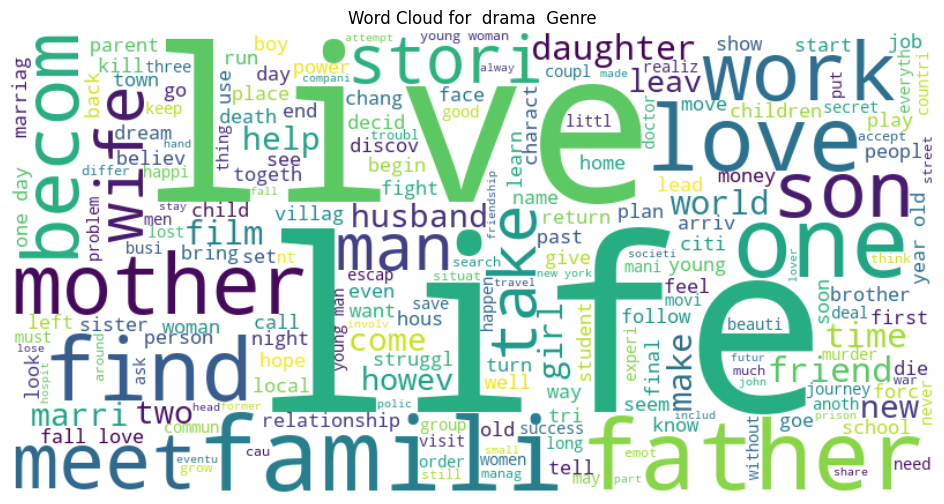

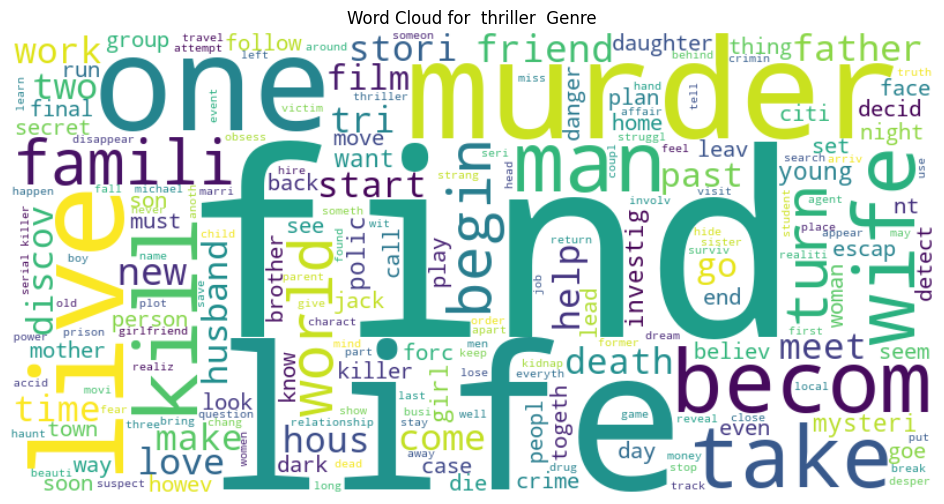

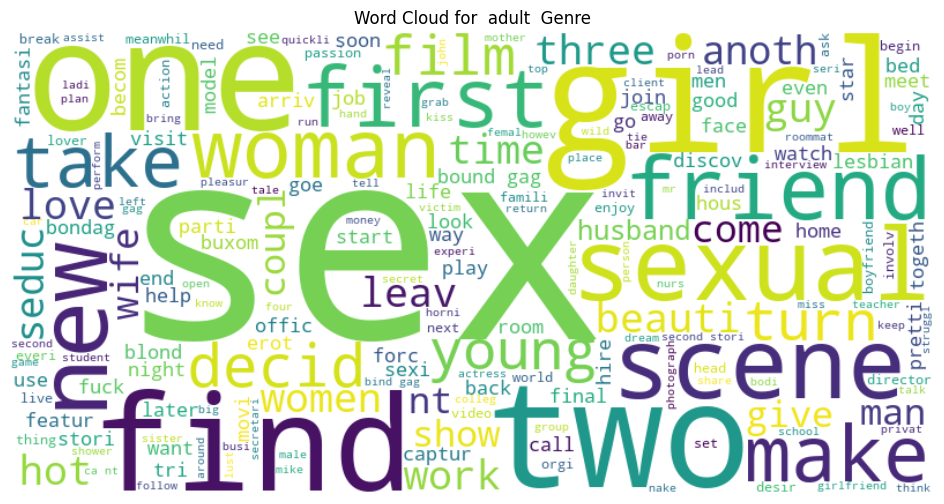

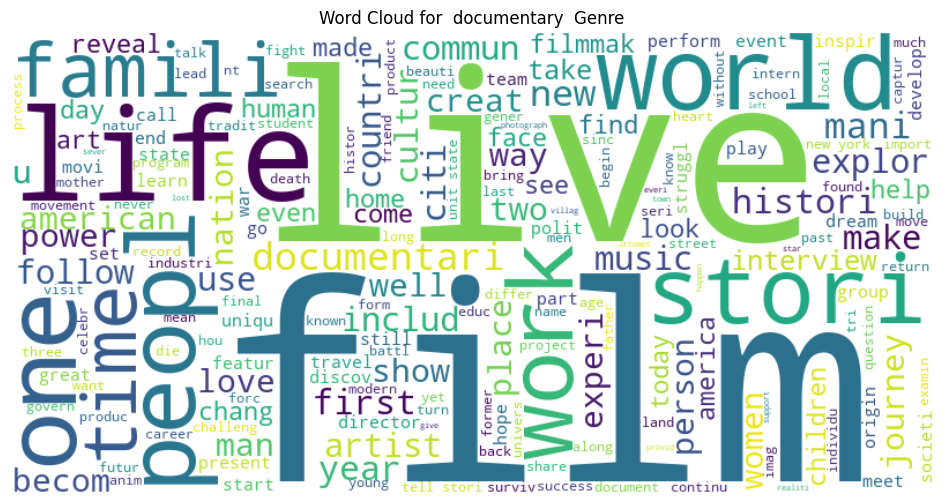

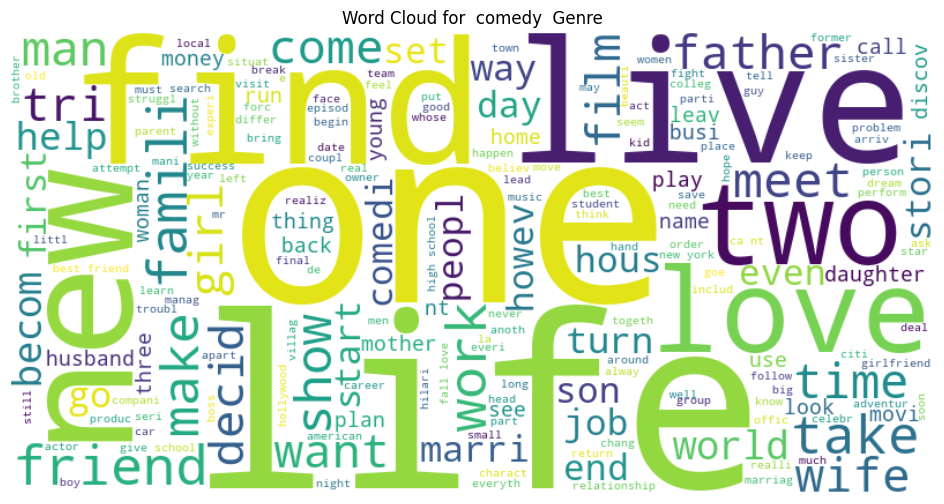

...

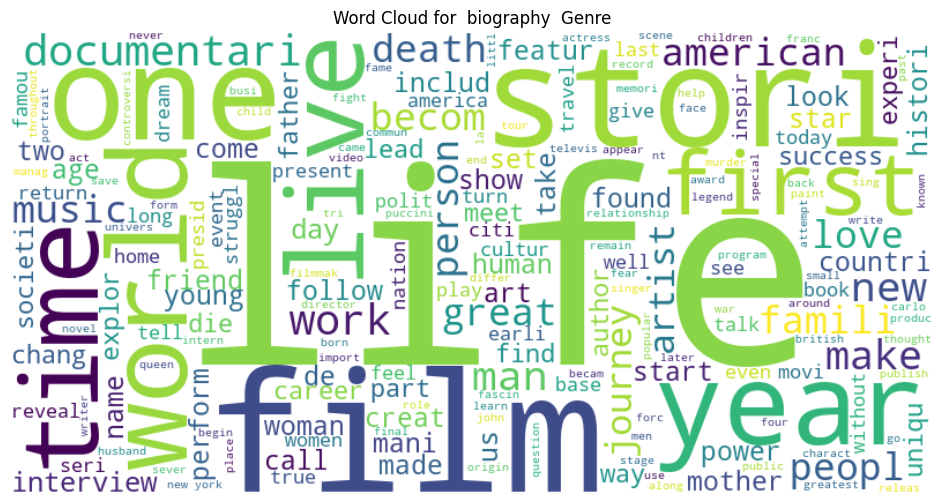

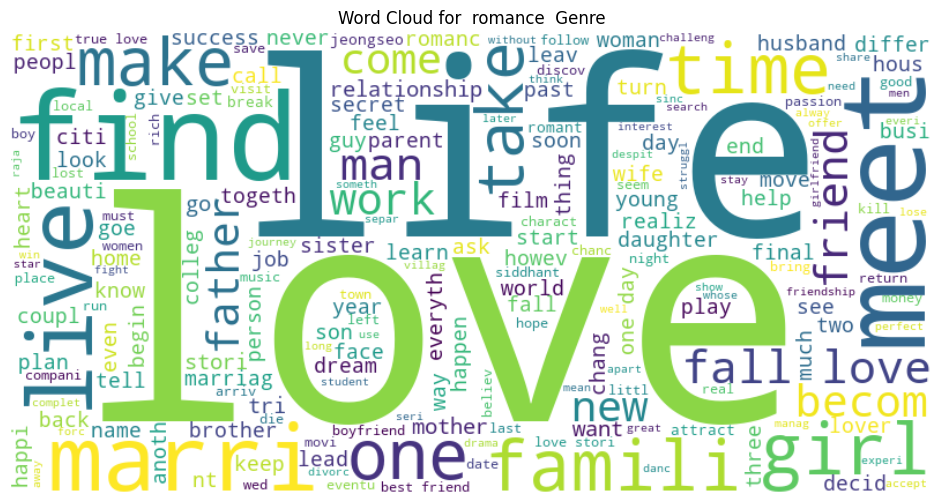

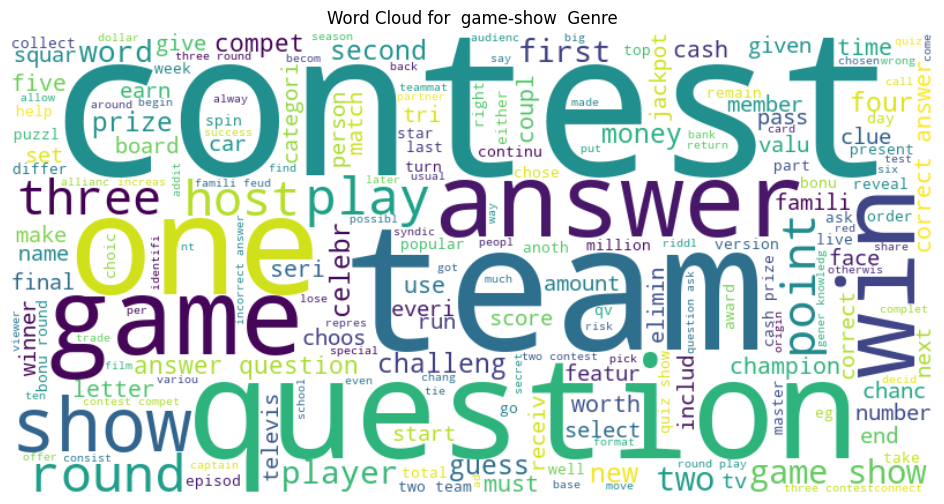

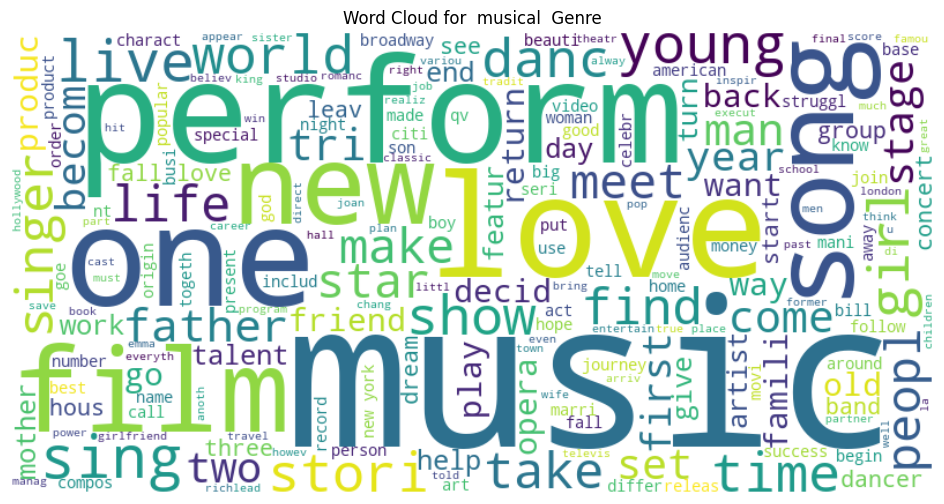

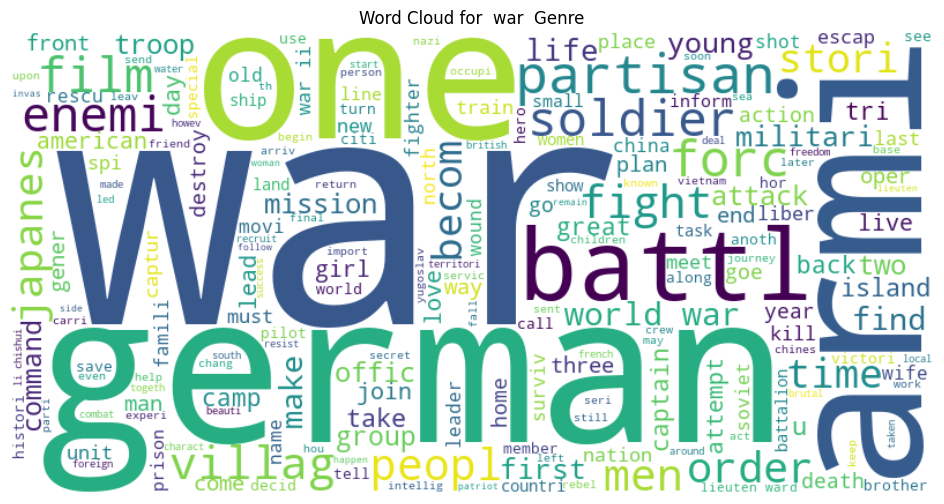

In [151]:
def plot_word_cloud(genre, genre_dataframe):
    all_text = ' '.join(genre_dataframe['Transformed_Description'])
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(all_text)
    
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {genre.capitalize()} Genre')
    plt.show()

# Generate and plot word clouds for each genre
for genre, df in genre_dataframes.items():
    plot_word_cloud(genre, df)


🧠 Feature Extraction with TF-IDF

Convert text data into numerical features using TF-IDF vectorization.



In [152]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB, BernoulliNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

 Initialize TF-IDF Vectorizer

In [153]:
vectorizer = TfidfVectorizer(max_features=5000)  

In [154]:
X_train = vectorizer.fit_transform(train_data['Transformed_Description'])
y_train = train_data['Genre_Encoded']
X_test = vectorizer.transform(test_data['Transformed_Description'])
y_test = test_data_solution['Genre_Encoded']


🤖 Model Training and Evaluation


Multinomial Naive Bayes


In [155]:
# Multinomial Naive Bayes
mnb = MultinomialNB()
mnb.fit(X_train, y_train)
y_pred_mnb = mnb.predict(X_test)

print("Multinomial Naive Bayes Accuracy:", accuracy_score(y_test, y_pred_mnb))
print("Multinomial Naive Bayes Classification Report:")
print(classification_report(y_test, y_pred_mnb))


Multinomial Naive Bayes Accuracy: 0.5187638376383764
Multinomial Naive Bayes Classification Report:
              precision    recall  f1-score   support

           0       0.57      0.10      0.17      1314
           1       0.52      0.08      0.14       590
           2       0.77      0.09      0.15       775
           3       0.00      0.00      0.00       498
           4       0.00      0.00      0.00       264
           5       0.52      0.43      0.47      7446
           6       0.00      0.00      0.00       505
           7       0.56      0.86      0.68     13096
           8       0.46      0.82      0.59     13612
           9       0.00      0.00      0.00       783
          10       0.00      0.00      0.00       322
          11       0.97      0.16      0.27       193
          12       0.00      0.00      0.00       243
          13       0.71      0.35      0.47      2204
          14       0.73      0.11      0.20       731
          15       0.00      0.00  

c:\Users\debam\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\debam\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\debam\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Bernoulli Naive Bayes

In [156]:
# Bernoulli Naive Bayes
bnb = BernoulliNB()
bnb.fit(X_train, y_train)
y_pred_bnb = bnb.predict(X_test)

print("Bernoulli Naive Bayes Accuracy:", accuracy_score(y_test, y_pred_bnb))
print("Bernoulli Naive Bayes Classification Report:")
print(classification_report(y_test, y_pred_bnb))


Bernoulli Naive Bayes Accuracy: 0.5150553505535055
Bernoulli Naive Bayes Classification Report:
              precision    recall  f1-score   support

           0       0.35      0.48      0.40      1314
           1       0.49      0.49      0.49       590
           2       0.26      0.18      0.21       775
           3       0.32      0.15      0.21       498
           4       0.02      0.03      0.02       264
           5       0.51      0.56      0.54      7446
           6       0.16      0.14      0.15       505
           7       0.75      0.63      0.68     13096
           8       0.65      0.52      0.58     13612
           9       0.30      0.14      0.19       783
          10       0.15      0.09      0.11       322
          11       0.80      0.50      0.62       193
          12       0.06      0.05      0.05       243
          13       0.59      0.63      0.61      2204
          14       0.34      0.72      0.46       731
          15       0.10      0.05      

Logistic Regression


In [157]:
# Logistic Regression
lr = LogisticRegression(max_iter=1000)
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)

print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_lr))
print("Logistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))


Logistic Regression Accuracy: 0.5868450184501846
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.48      0.31      0.38      1314
           1       0.61      0.27      0.37       590
           2       0.59      0.18      0.27       775
           3       0.52      0.09      0.15       498
           4       0.00      0.00      0.00       264
           5       0.54      0.60      0.57      7446
           6       0.33      0.04      0.07       505
           7       0.67      0.84      0.75     13096
           8       0.55      0.77      0.64     13612
           9       0.46      0.09      0.15       783
          10       0.44      0.05      0.09       322
          11       0.86      0.52      0.65       193
          12       1.00      0.00      0.01       243
          13       0.65      0.59      0.62      2204
          14       0.64      0.46      0.54       731
          15       0.25      0.01      0.03

c:\Users\debam\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\debam\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\debam\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Support Vector Machine (SVM)


In [158]:
from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import make_pipeline
from sklearn.discriminant_analysis import StandardScaler
from sklearn.svm import LinearSVC


tfidf_vectorizer = TfidfVectorizer(max_features=2000)
svd = TruncatedSVD(n_components=300)  
X_train_reduced = svd.fit_transform(X_train)
X_test_reduced = svd.fit_transform(X_test) 


y_train = train_data['Genre_Encoded']
y_test = test_data_solution['Genre_Encoded']


In [159]:
# SVM with Linear Kernel
svc = make_pipeline(StandardScaler(), LinearSVC())

In [160]:
# Model Training
svc.fit(X_train_reduced, y_train)


c:\Users\debam\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning:

The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.

c:\Users\debam\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:1237: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



Pipeline(steps=[('standardscaler', StandardScaler()),
                ('linearsvc', LinearSVC())])

In [161]:
y_pred = svc.predict(X_test_reduced)

In [162]:
# Evaluation
print("SVM Accuracy:", accuracy_score(y_test, y_pred))
print("SVM Classification Report:")
print(classification_report(y_test, y_pred, target_names=train_data['Genre'].unique()))


SVM Accuracy: 0.38953874538745387
SVM Classification Report:
               precision    recall  f1-score   support

       drama        0.09      0.02      0.03      1314
    thriller        0.02      0.01      0.01       590
       adult        0.01      0.00      0.00       775
 documentary        0.00      0.00      0.00       498
      comedy        0.00      0.00      0.00       264
       crime        0.26      0.31      0.28      7446
  reality-tv        0.00      0.00      0.00       505
      horror        0.51      0.77      0.61     13096
       sport        0.43      0.57      0.49     13612
   animation        0.00      0.00      0.00       783
      action        0.00      0.00      0.00       322
     fantasy        0.03      0.04      0.03       193
       short        0.00      0.00      0.00       243
      sci-fi        0.17      0.12      0.14      2204
       music        0.23      0.11      0.15       731
   adventure        0.00      0.00      0.00       276
   

c:\Users\debam\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\debam\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\debam\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Model Comparison:

1. Multinomial Naive Bayes
Accuracy: 51.88%
2. Bernoulli Naive Bayes
Accuracy: 51.51%
Overall accuracy is similar to Multinomial Naive Bayes, but with different precision and recall trade-offs.
3. Logistic Regression
Accuracy: 58.68%
4. SVM (Support Vector Machine)
Accuracy: 38.21%

- Logistic Regression is the best performing model among the ones tested:
Better Overall Performance: Higher accuracy and better handling of multiple genres compared to other models.
Balanced Precision and Recall: Provides a good balance for various genres.
Recommendations
Use Logistic Regression as the primary model for genre classification due to its highest accuracy and generally balanced performance.
